## version8 : 10/26 –

- ver7のモデルを修正したバージョン

### Libraries

In [321]:
import os
import sys
import math
import time
import yaml
import errno
import random
import datetime
import numpy as np
import pandas as pd
from tqdm import trange
from tqdm.notebook import tqdm

from sklearn.metrics import mean_squared_error, mean_absolute_error

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt
import plotly.graph_objects as go

# set random seed
fix_seed = 1111
np.random.seed(fix_seed)
torch.manual_seed(fix_seed)

# set device 
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
print(device)

mps


### Import parameters and data

In [357]:
# load parameters
with open('/Users/koki/PycharmProjects/MasterThesis/params/config_lstm_seq2seq.yml', 'r') as yml:
    yaml_data = yaml.safe_load(yml)

In [323]:
# import data
df = pd.read_csv('/Users/koki/PycharmProjects/MasterThesis/data/preprocessed/201601to202309_10areas_for_analysis.csv')
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')
# choose hours to use
time_list = yaml_data['dataset']['time_list']
if time_list != 'all':
    df = df.loc[df.index.hour.isin(time_list)]

### Define dataset

In [324]:
class SequenceDataset(Dataset):
    def __init__(self, dataframe, seq_len_src=56, seq_len_tgt=8, lag_len=8):
        self.seq_len_src = seq_len_src
        self.lag_len = lag_len
        self.seq_len_tgt = seq_len_tgt
        self.df = torch.tensor(dataframe.values).float()
        self.len = math.floor((len(self.df) - self.seq_len_src - self.seq_len_tgt) / self.lag_len) + 1

    def __len__(self):
        return self.len

    def __getitem__(self, i):
        if type(i) == slice:
            raise Exception('Exception: Expected int, inputted slice!')
            
        X = self.df[i*self.lag_len:i*self.lag_len+self.seq_len_src]
        Y = self.df[i*self.lag_len+self.seq_len_src:i*self.lag_len+self.seq_len_src+self.seq_len_tgt]
        
        return X, Y
    
    def input_size(self):
        return self.df.shape[1]

### Split data

In [325]:
batch_size = yaml_data['dataset']['batch_size']
seq_len_src = yaml_data['dataset']['seq_len_src']
seq_len_tgt = yaml_data['dataset']['seq_len_tgt']
lag_len = yaml_data['dataset']['lag_len']

# set start dates and end dates
train_start = yaml_data['dataset']['train_start']
train_end = yaml_data['dataset']['train_end']
valid_start = yaml_data['dataset']['valid_start']
valid_end = yaml_data['dataset']['valid_end']
test_start = yaml_data['dataset']['test_start']
test_end = yaml_data['dataset']['test_end']

# split df into train, valid and test data
df_train = df.loc[train_start:train_end].copy()
df_valid = df.loc[valid_start:valid_end].copy()
df_test = df.loc[test_start:test_end].copy()

# df for prediction
df_valid_for_pred = pd.concat([df_train.iloc[-seq_len_src:, :], df_valid])  # valid_dataの1期目から予測するために、前日もテストデータに含める。
df_test_for_pred = pd.concat([df_valid.iloc[-seq_len_src:, :], df_test])  # test_dataの1期目から予測するために、前日もテストデータに含める。

# print the fraction of each dataset
print("Train set fraction: {:.3f}%".format(len(df_train)/len(df)*100))
print("Valid set fraction: {:.3f}%".format(len(df_valid)/len(df)*100))
print("Test set fraction: {:.3f}%".format(len(df_test)/len(df)*100))

Train set fraction: 77.456%
Valid set fraction: 12.898%
Test set fraction: 9.647%


### Set dataloader

In [326]:
# create dataset
train_dataset = SequenceDataset(df_train, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=1)
valid_dataset = SequenceDataset(df_valid, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)
test_dataset = SequenceDataset(df_test, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)

# dataset for prediction
valid_dataset_for_pred = SequenceDataset(df_valid_for_pred, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)
test_dataset_for_pred = SequenceDataset(df_test_for_pred, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)

print("Length of each dataset:")
print("    Train:{}, Valid:{}, Test:{}".format(len(train_dataset), len(valid_dataset), len(test_dataset)))

# create dataloader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=0, pin_memory=True)
# valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)

# check the shape of a batch
X, y = next(iter(train_loader))
print("Features shape:", X.shape)  # [batch size, sequence length, number of features]
print("Target shape:", y.shape)

Length of each dataset:
    Train:8737, Valid:358, Test:266
Features shape: torch.Size([64, 28, 66])
Target shape: torch.Size([64, 4, 66])


### Define LSTM seq2seq

In [327]:
class lstm_seq2seq(nn.Module):
    ''' 
    train LSTM encoder-decoder and make predictions
    モデル1：全変数をLSTMに入力し、二層の線型結合層を通して予測値を出力
    '''
    
    def __init__(self, num_features, hidden_size, num_layers, dropout, batch_size, num_features_pred):

        '''
        : param input_size:     the number of expected features in the input X
        : param hidden_size:    the number of features in the hidden state h
        '''

        super(lstm_seq2seq, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.batch_size= batch_size
        self.num_features_pred = num_features_pred
        
        # define LSTM layer
        self.lstm = nn.LSTM(input_size = num_features, hidden_size = hidden_size, num_layers = num_layers, batch_first=True, dropout = dropout)
        # define fc layer
        self.linear = nn.Linear(hidden_size, num_features)
        self.linear2 = nn.Linear(num_features, num_features_pred)
        
    def encoder(self, src):
        '''
        : param src:                   input of shape (# in batch, seq_len, input_size)
        : return lstm_out, hidden:     lstm_out gives all the hidden states in the sequence;
        :                              hidden gives the hidden state and cell state for the last
        :                              element in the sequence 
        '''
        
        # h0 = torch.zeros(self.num_layers, self.batch_size, self.hidden_size, device=device, requires_grad=True) 
        # c0 = torch.zeros(self.num_layers, self.batch_size, self.hidden_size, device=device, requires_grad=True)
        h0 = None
        lstm_out, (h,c) = self.lstm(src, h0)
        
        return (h, c)
    
    def decoder(self, src, encoder_hidden_states):
        '''        
        : param src:                        should be 3D (batch_size, seq_len, input_size)
        : param encoder_hidden_states:      hidden states
        : return output, hidden:            output gives all the hidden states in the sequence;
        :                                   hidden gives the hidden state and cell state for the last
        :                                   element in the sequence 
        '''
        
        lstm_out, (h, c) = self.lstm(src, encoder_hidden_states)
        output = self.linear(lstm_out)
        output = self.linear2(output)
        
        return output, (h, c)
    
    def forward(self, src, tgt):
        '''
        : param src:                       input tensor with shape (# in batch, seq_len,  number features); PyTorch tensor    
        : param tgt:                       target tensor with shape (# in batch, seq_len, number features); PyTorch tensor
        '''
        
        encoder_hidden = self.encoder(src)  # only encoder_hidden is used
        decoder_output, decoder_hidden = self.decoder(tgt, encoder_hidden)  # decoder_output.shape = [batch_size, seq_len, num_features] 

        return decoder_output

In [328]:
# class lstm_seq2seq(nn.Module):
#     ''' 
#     train LSTM encoder-decoder and make predictions
#     モデル2：人流データのみをLSTMに入力し、ダミーは後から線型結合
#     '''
    
#     def __init__(self, num_features, hidden_size, num_layers, dropout, batch_size, num_features_pred):

#         '''
#         : param input_size:     the number of expected features in the input X
#         : param hidden_size:    the number of features in the hidden state h
#         '''

#         super(lstm_seq2seq, self).__init__()
#         self.hidden_size = hidden_size
#         self.num_layers = num_layers
#         self.batch_size= batch_size
#         self.num_features_pred = num_features_pred
        
#         # define LSTM layer
#         self.lstm = nn.LSTM(input_size = num_features_pred, hidden_size = hidden_size, num_layers = num_layers, batch_first=True, dropout = dropout)
#         # define fc layer
#         self.linear = nn.Linear(hidden_size, num_features_pred)
#         self.linear2 = nn.Linear(num_features, 128)
#         self.linear3 = nn.Linear(128, 32)
#         self.linear4 = nn.Linear(32, num_features_pred)
#         # define relu
#         self.relu = nn.ReLU()
#         # define dropout
#         self.dropout = nn.Dropout(0.3) 
        
#     def encoder(self, src):
#         '''
#         : param src:                   input of shape (# in batch, seq_len, input_size)
#         : return lstm_out, hidden:     lstm_out gives all the hidden states in the sequence;
#         :                              hidden gives the hidden state and cell state for the last
#         :                              element in the sequence 
#         '''
        
#         # h0 = torch.zeros(self.num_layers, self.batch_size, self.hidden_size, device=device, requires_grad=True) 
#         # c0 = torch.zeros(self.num_layers, self.batch_size, self.hidden_size, device=device, requires_grad=True)
#         h0 = None
#         lstm_out, (h,c) = self.lstm(src[:,:,:num_features_pred], h0)
        
#         return (h, c)
    
#     def decoder(self, src, encoder_hidden_states):
#         '''        
#         : param src:                        should be 3D (batch_size, seq_len, num_features)
#         : param encoder_hidden_states:      hidden states
#         : return output, hidden:            output gives all the hidden states in the sequence;
#         :                                   hidden gives the hidden state and cell state for the last
#         :                                   element in the sequence 
#         '''
        
#         lstm_out, (h, c) = self.lstm(src[:,:,:num_features_pred], encoder_hidden_states)
#         output = self.linear(lstm_out)
#         output = torch.cat((output, src[:,:,num_features_pred:]), dim=2)
#         output = self.linear2(output)
#         output = self.relu(output)
#         output = self.dropout(output)
#         output = self.linear3(output)
#         output = self.relu(output)
#         output = self.dropout(output)
#         output = self.linear4(output)
#         output = self.relu(output)
        
#         return output, (h, c)
    
#     def forward(self, src, tgt):
#         '''
#         : param src:                       input tensor with shape (# in batch, seq_len,  number features); PyTorch tensor    
#         : param tgt:                       target tensor with shape (# in batch, seq_len, number features); PyTorch tensor
#         '''
        
#         encoder_hidden = self.encoder(src)  # only encoder_hidden is used
#         decoder_output, decoder_hidden = self.decoder(tgt, encoder_hidden)  # decoder_output.shape = [batch_size, seq_len, num_features] 

#         return decoder_output

In [329]:
# class lstm_seq2seq(nn.Module):
#     ''' 
#     train LSTM encoder-decoder and make predictions
#     モデル3：人流データのみをLSTMに入力し、ダミーをすぐに結合して線型結合
#     '''
    
#     def __init__(self, num_features, hidden_size, num_layers, dropout, batch_size, num_features_pred):

#         '''
#         : param input_size:     the number of expected features in the input X
#         : param hidden_size:    the number of features in the hidden state h
#         '''

#         super(lstm_seq2seq, self).__init__()
#         self.hidden_size = hidden_size
#         self.num_layers = num_layers
#         self.batch_size= batch_size
#         self.num_features_pred = num_features_pred
        
#         # define LSTM layer
#         self.lstm = nn.LSTM(input_size = num_features_pred, hidden_size = hidden_size, num_layers = num_layers, batch_first=True, dropout = dropout)
#         # define fc layer
#         self.linear = nn.Linear(hidden_size+num_features-num_features_pred, 128)
#         self.linear2 = nn.Linear(128, 32)
#         self.linear3 = nn.Linear(32, num_features_pred)
#         # define relu
#         self.relu = nn.ReLU()
#         # define dropout
#         self.dropout = nn.Dropout(0.3) 
        
#     def encoder(self, src):
#         '''
#         : param src:                   input of shape (# in batch, seq_len, input_size)
#         : return lstm_out, hidden:     lstm_out gives all the hidden states in the sequence;
#         :                              hidden gives the hidden state and cell state for the last
#         :                              element in the sequence 
#         '''
        
#         # h0 = torch.zeros(self.num_layers, self.batch_size, self.hidden_size, device=device, requires_grad=True) 
#         # c0 = torch.zeros(self.num_layers, self.batch_size, self.hidden_size, device=device, requires_grad=True)
#         h0 = None
#         lstm_out, (h,c) = self.lstm(src[:,:,:num_features_pred], h0)
        
#         return (h, c)
    
#     def decoder(self, src, encoder_hidden_states):
#         '''        
#         : param src:                        should be 3D (batch_size, seq_len, num_features)
#         : param encoder_hidden_states:      hidden states
#         : return output, hidden:            output gives all the hidden states in the sequence;
#         :                                   hidden gives the hidden state and cell state for the last
#         :                                   element in the sequence 
#         '''
        
#         lstm_out, (h, c) = self.lstm(src[:,:,:num_features_pred], encoder_hidden_states)
#         output = torch.cat((lstm_out, src[:,:,num_features_pred:]), dim=2)
#         output = self.linear(output)
#         output = self.relu(output)
#         output = self.dropout(output)
#         output = self.linear2(output)
#         output = self.relu(output)
#         output = self.dropout(output)
#         output = self.linear3(output)
#         output = self.relu(output)
        
#         return output, (h, c)
    
#     def forward(self, src, tgt):
#         '''
#         : param src:                       input tensor with shape (# in batch, seq_len,  number features); PyTorch tensor    
#         : param tgt:                       target tensor with shape (# in batch, seq_len, number features); PyTorch tensor
#         '''
        
#         encoder_hidden = self.encoder(src)  # only encoder_hidden is used
#         decoder_output, decoder_hidden = self.decoder(tgt, encoder_hidden)  # decoder_output.shape = [batch_size, seq_len, num_features] 

#         return decoder_output

### Define training, validation and prediction

In [330]:
def train(model, data_loader, num_features_pred):
    total_loss = []
    for n_batches, (src, tgt) in enumerate(data_loader):
        src = src.to(device)
        tgt = tgt.to(device)
        
        # target for decoder
        input_tgt = torch.cat((src[:,-1:,:], tgt[:, :-1, :]), dim=1)
        
        # zero the gradient
        optimizer.zero_grad()
        
        output = model(src=src, tgt=input_tgt)

        # compute the loss
        loss = criterion(output[:,:,0:num_features_pred], tgt[:,:,0:num_features_pred])

        total_loss.append(loss.cpu().detach())

        # backpropagation
        loss.backward()
        optimizer.step()
    
    # change learning rate
    scheduler.step()
    
    # return loss for epoch 
    return np.average(total_loss)


def predict(model, dataset, num_features_pred):
    model.eval()
    with torch.no_grad():
        all_outputs = torch.Tensor().to(device)
        for i in tqdm(range(len(dataset))):
            src = dataset[i][0].to(device)
            tgt = dataset[i][1].to(device)

            src = src.unsqueeze(0)
            tgt = tgt.unsqueeze(0)

            encoder_hidden = model.encoder(src)

            # initialize tensor for predictions
            outputs = torch.Tensor().to(device)

            # input for decoder
            decoder_input = src[:, -1:, :]
            decoder_hidden = encoder_hidden

            # predict recursively
            for t in range(tgt.shape[1]):
                decoder_output, decoder_hidden = model.decoder(decoder_input, decoder_hidden)  # decoder_output.shape = [batch_size, 1(seq_len), num_features]
                outputs = torch.cat((outputs, decoder_output[:, -1, :]), dim=0)

                # decoder input at the next period = (location output from prediction) + (acurate dummy input from test data)
                decoder_input = torch.cat((decoder_output[:, :, 0:num_features_pred], src[:, t:t+1, num_features_pred:]), dim=2)

            all_outputs = torch.cat([all_outputs, outputs], dim=0)

    return all_outputs[:, :num_features_pred].to('cpu').detach().numpy()

### Define parameters

In [333]:
num_features = df.shape[1]
hidden_size = yaml_data['model']['hidden_size']
num_layers = yaml_data['model']['num_layers']
dropout = yaml_data['model']['dropout']
num_features_pred = yaml_data['training']['num_features_pred']
n_epochs = yaml_data['training']['n_epochs']
learning_rate = yaml_data['training']['learning_rate']
milestones = yaml_data['training']['milestones']
gamma = yaml_data['training']['gamma']

model = lstm_seq2seq(num_features = num_features, 
                     hidden_size = hidden_size, 
                     num_layers = num_layers, 
                     dropout = dropout,
                     batch_size=batch_size,
                     num_features_pred=num_features_pred).to(device)

optimizer = optim.Adam(model.parameters(), lr = learning_rate)
# scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15, 30], gamma=0.1)
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=milestones, gamma=gamma)
criterion = nn.MSELoss().to(device)

### Training

In [334]:
start = time.time()
train_losses = []
with trange(n_epochs) as tr:
    for it in tr:
        # train
        loss_train = train(model=model, data_loader=train_loader, num_features_pred=num_features_pred)
        # convert to RMSE
        loss_train = math.sqrt(loss_train)
        # append epoch loss
        train_losses.append(loss_train)
        # progress bar 
        tr.set_postfix(Train_loss="{0:.3f}".format(loss_train))

# calculate execution time        
end = time.time()
t = math.floor(end-start)
elapsed_hour = t // 3600
elapsed_minute = (t % 3600) // 60
elapsed_second = (t % 3600 % 60)
elapsed_time = str(elapsed_hour).zfill(2) + ":" + str(elapsed_minute).zfill(2) + ":" + str(elapsed_second).zfill(2)

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [29:10<00:00,  1.75s/it, Train_loss=10118.427]


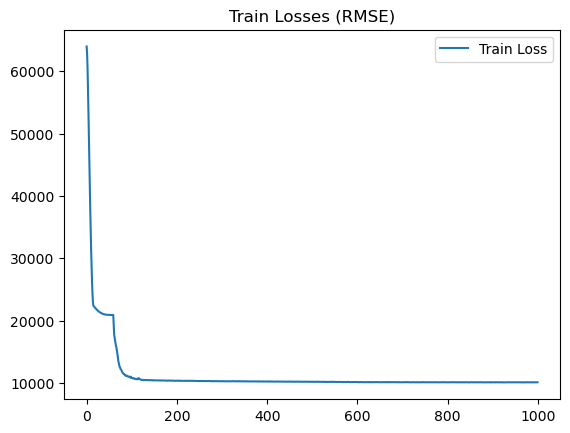

In [335]:
plt.plot(train_losses, label='Train Loss')
plt.title('Train Losses (RMSE)')
plt.legend()
plt.show()

### (Load a past model)

In [336]:
'''
This code is used only for loading the model and checking its prediction.
'''
# # set name of the model
# model_num = 1
# # load the model and its loss
# model = torch.load('/Users/koki/PycharmProjects/MasterThesis/models/model_' + str(model_num).zfill(2) + '.pth')
# loss = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='train_losses', usecols=[model_num-1])
# train_losses = loss.iloc[:,0].to_list()

'\nThis code is used only for loading the model and checking its prediction.\n'

In [337]:
# torch.save(model.to('cpu').state_dict(), '/Users/koki/PycharmProjects/MasterThesis/model_40_for_serena.pth')
# torch.save(model.to('cpu'), '/Users/koki/PycharmProjects/MasterThesis/model_40_for_serena2.pth')
# model = torch.load('/Users/koki/PycharmProjects/MasterThesis/model_40_for_serena2.pth').to(device)

### Predict

In [353]:
num_features_pred = yaml_data['training']['num_features_pred']

# make y_pred df
pred = predict(model = model, dataset = valid_dataset_for_pred, num_features_pred = num_features_pred)
y_pred = pd.DataFrame(pred, columns=df.columns[:num_features_pred], index=df_valid.index).add_prefix('pred_')

  0%|          | 0/365 [00:00<?, ?it/s]

### Calculate RMSE and MAE (predicted values and actual values)

In [354]:
rmse, mae = {}, {}
for i in range(y_pred.shape[1]):
    rmse[df.columns[i]] = mean_squared_error(df_valid.iloc[:,i], y_pred.iloc[:,i], squared=False)
    mae[df.columns[i]] = mean_absolute_error(df_valid.iloc[:,i], y_pred.iloc[:,i])

rmse_pre_actu = pd.Series(rmse)
mae_pre_actu = pd.Series(mae)

print('------------RMSE------------')
print(rmse_pre_actu)
print('Average :', np.mean(rmse_pre_actu))
print('------------MAE-------------')
print(mae_pre_actu)
print('Average :', np.mean(mae_pre_actu))

------------RMSE------------
渋谷駅_total      26016.679770
新宿駅_total      27092.329060
町田駅_total       9337.526800
川崎駅_total      12957.656011
立川駅_total      13076.590170
八王子駅_total      7451.247353
北千住駅_total      7875.106628
東京駅_total      35080.100249
赤羽駅_total       7883.124987
自由が丘駅_total     6952.967038
dtype: float64
Average : 15372.332806636981
------------MAE-------------
渋谷駅_total      23156.108247
新宿駅_total      22926.450997
町田駅_total       8045.029112
川崎駅_total      11320.125536
立川駅_total      11516.224457
八王子駅_total      6651.667673
北千住駅_total      7194.553210
東京駅_total      28593.967546
赤羽駅_total       6831.491627
自由が丘駅_total     6159.199463
dtype: float64
Average : 13239.481786774937


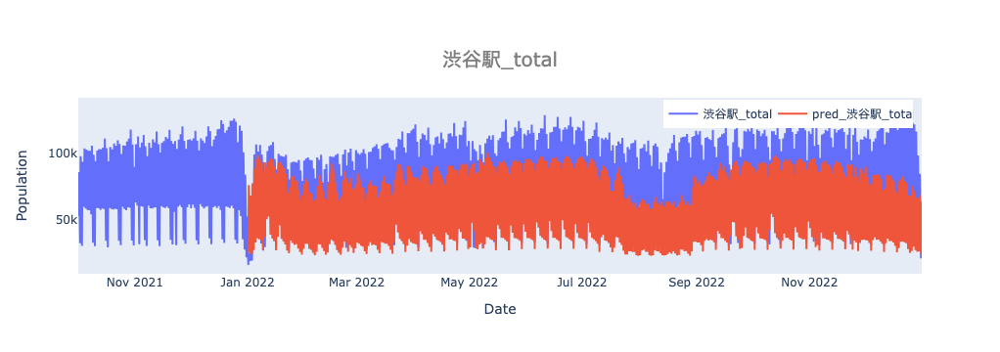

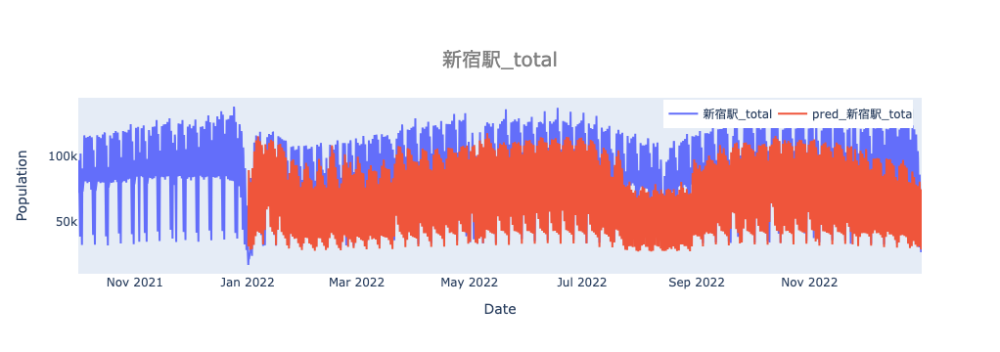

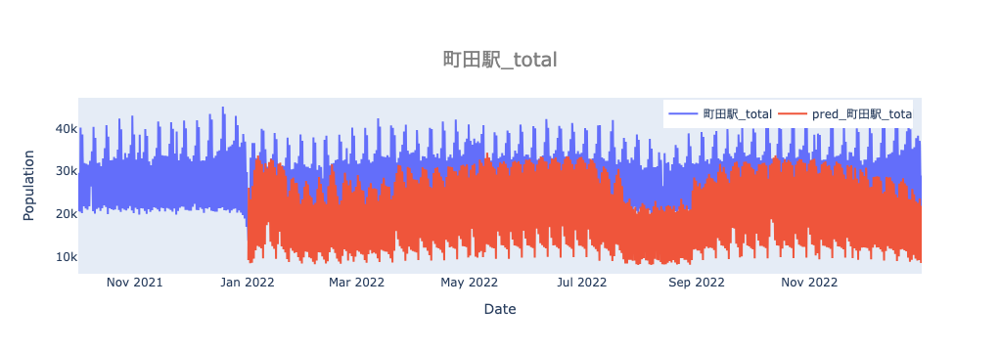

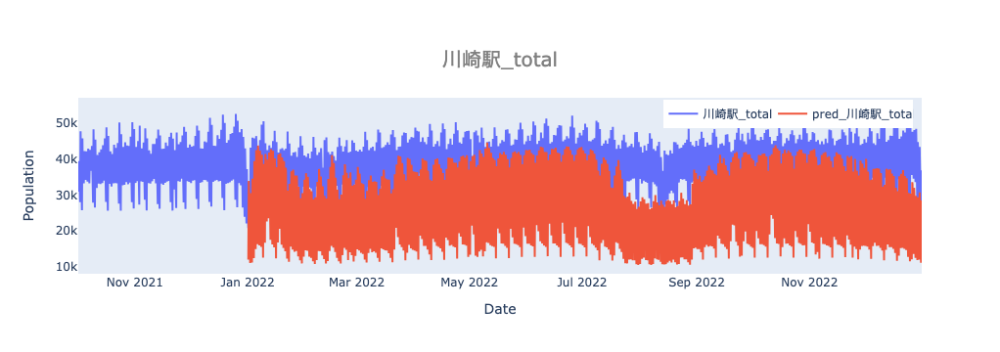

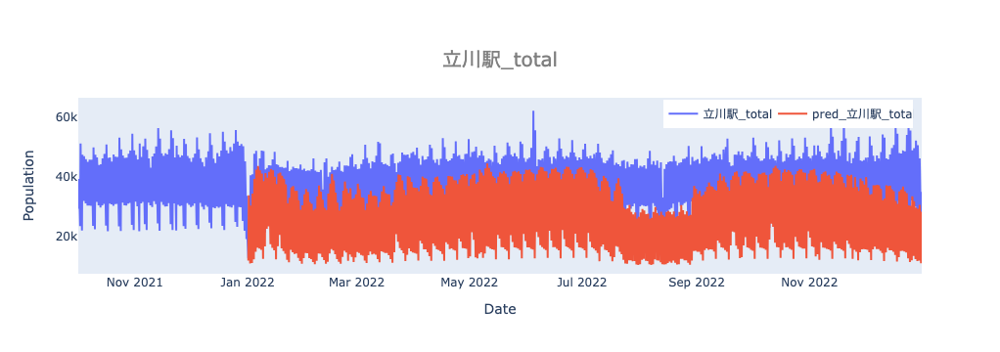

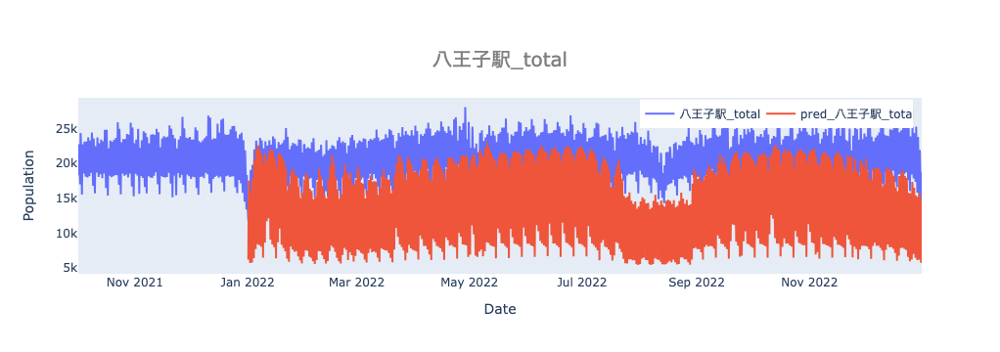

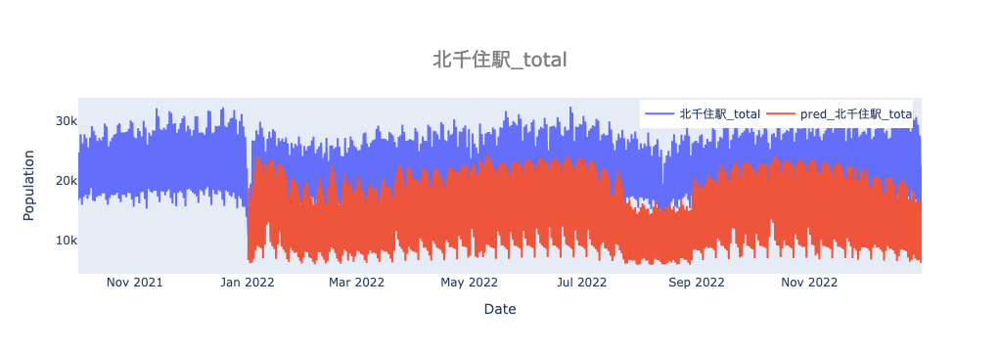

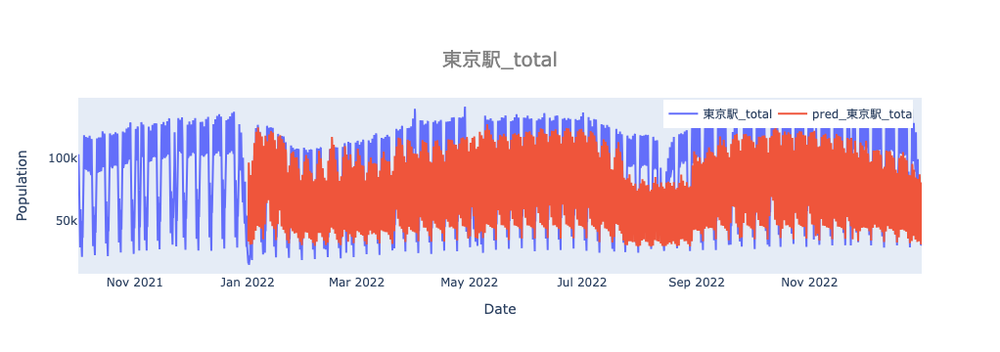

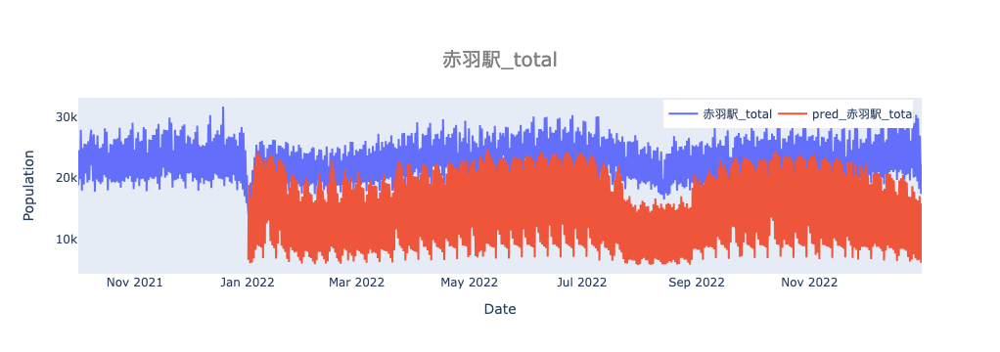

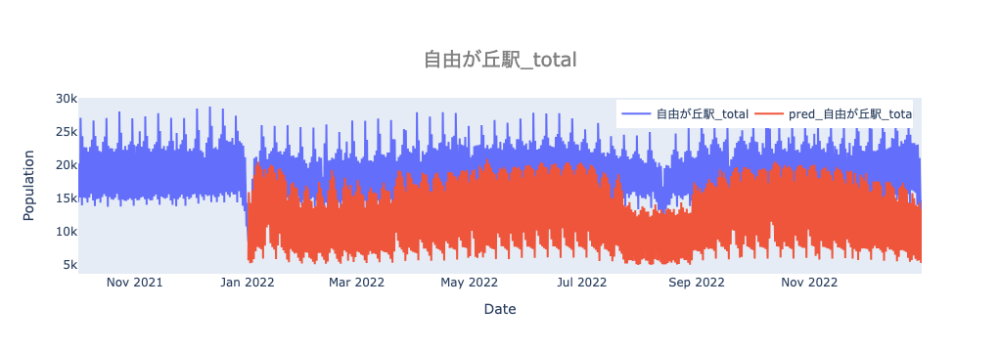

In [342]:
# make y_true df from a specific date
_df_train = df_train.loc['2021-10-01': ,:]
y_true = pd.concat([_df_train, df_valid]).iloc[:, :num_features_pred]
# y_true = df.loc['2021-10-01':valid_end, :].iloc[:, :num_features_pred]

# plot with plotly     
for i in range(y_pred.shape[1]):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y_true.index, y=y_true.iloc[:, i], name=y_true.columns[i]))
    fig.add_trace(go.Scatter(x=y_pred.index, y=y_pred.iloc[:, i], name=y_pred.columns[i]))
    
    fig.update_xaxes(title="Date",showgrid=False)
    fig.update_yaxes(title="Population", showgrid=False)
    fig.update_layout(legend=dict(x=0.99,
                              y=0.99,
                              xanchor='right',
                              yanchor='top',
                              orientation='h',
                              ),
                      hovermode='x unified',
                      title=dict(text=y_true.columns[i],
                                 font=dict(size=20, color='grey'),
                                 xref='paper', # container or paper
                                 x=0.5,
                                 y=0.85,
                                 xanchor='center'
                                )
                     )
    fig.show()

### Calculate RMSE and MAE (benchmark and actual values)

In [355]:
# df setup
num_features_pred = yaml_data['training']['num_features_pred']
df_bench_pred = pd.DataFrame([], columns=df.columns[:num_features_pred])
df_bench_true = pd.DataFrame([], columns=df.columns[:num_features_pred])

# month range and dow lists
bench_range = pd.date_range(start=valid_start, end=valid_end, freq='M')
dow_list = ['dow_Mon','dow_Tue','dow_Wed','dow_Thu','dow_Fri','dow_Sat', 'dow_Sun']

# get data from df_train/df_valid and compute mean
for month in bench_range:
    m = str(int(month.strftime('%m'))) # convert month to the same format as in df
    for dow in dow_list:
        query = f'month_{m} == 1 & {dow} == 1 & official_holiday == 0 & unofficial_holiday == 0' # month, dow, and non-holiday
        df_bench_pred.loc[month.strftime('%Y-%m') + ' ' + dow] = df_train.query(query).iloc[:, :num_features_pred].mean()
        df_bench_true.loc[month.strftime('%Y-%m') + ' ' + dow] = df_valid.query(query).iloc[:, :num_features_pred].mean()

# display(df_bench_pred)
# display(df_bench_true)

# calculate RMSE and MAE
rmse, mae = {}, {}
for i in range(num_features_pred):
    rmse[df.columns[i][:-6]] = mean_squared_error(df_bench_pred.iloc[:, i], df_bench_true.iloc[:, i], squared=False)
    mae[df.columns[i][:-6]] = mean_absolute_error(df_bench_pred.iloc[:, i], df_bench_true.iloc[:, i])

rmse_ben_actu = pd.Series(rmse)
mae_ben_actu = pd.Series(mae)
print('------------RMSE------------')
print(rmse_ben_actu)
print('Average :', np.mean(rmse_ben_actu))
print('------------MAE-------------')
print(mae_ben_actu)
print('Average :', np.mean(mae_ben_actu))

------------RMSE------------
渋谷駅       7848.122436
新宿駅       9840.043982
町田駅       1925.866582
川崎駅       1652.203025
立川駅       1849.590238
八王子駅       770.125098
北千住駅       886.736724
東京駅      21193.220463
赤羽駅       1027.694823
自由が丘駅      638.897746
dtype: float64
Average : 4763.2501115993055
------------MAE-------------
渋谷駅       6151.922158
新宿駅       8199.599494
町田駅       1706.494510
川崎駅       1342.159717
立川駅       1430.606879
八王子駅       583.688513
北千住駅       723.758281
東京駅      17788.057493
赤羽駅        860.785846
自由が丘駅      504.958025
dtype: float64
Average : 3929.2030915314085


In [344]:
# # make y_true df
# # y_true = df_valid.iloc[:, 0:num_features_pred]

# # make y_true df from a specific date
# y_true = df.loc['2021-10-01':valid_end, :].iloc[:, :num_features_pred]

# # plot with plotly     
# for i in range(y_pred.shape[1]):
#     fig = go.Figure()
#     fig.add_trace(go.Scatter(x=y_true.index, y=y_true.iloc[:, i], name=y_true.columns[i]))
#     fig.add_trace(go.Scatter(x=y_pred.index, y=y_pred.iloc[:, i], name=y_pred.columns[i]))
    
#     fig.update_xaxes(title="Date",showgrid=False)
#     fig.update_yaxes(title="Population", showgrid=False)
#     fig.update_layout(legend=dict(x=0.99,
#                               y=0.99,
#                               xanchor='right',
#                               yanchor='top',
#                               orientation='h',
#                               ),
#                       hovermode='x unified',
#                       title=dict(text=y_true.columns[i],
#                                  font=dict(size=20, color='grey'),
#                                  xref='paper', # container or paper
#                                  x=0.5,
#                                  y=0.85,
#                                  xanchor='center'
#                                 )
#                      )
#     fig.show()

### Anomaly detection for each location

### Anomaly detection for Tokyo

In [345]:
def calc_anomaly_scores(matrix_valid, matrix_test):
    '''
    : calculate anomaly scores at each day by quadratic form
    : matrix_valid :  valid data for calculating mean and variance;  numpy matrix
    : matrix_test  :  predicted test data for getting anomaly scores;  numpy matrix
    : return       :  anomaly_scores; numpy array
    '''
    # compute mean and cov inverse
    mean = matrix_valid.mean(axis=0)
    cov_inv = np.matrix(np.cov(matrix_valid, rowvar=False)).getI()

    # apply quadratic formula to each row of matrix
    output = np.zeros(matrix_test.shape[0])
    for i in range(matrix_test.shape[0]):
        output[i] = ((matrix_test[i] - mean) * cov_inv * np.transpose(matrix_test[i] - mean)).item(0)

    return output


# predict with test data
pred = predict(model = model, dataset = test_dataset_for_pred, num_features_pred = num_features_pred)
y_pred = pd.DataFrame(pred, columns=df.columns[:num_features_pred], index=df_test.index).add_prefix('pred_')

# calculate whole Tokyo population by quadratic form
anomaly_scores = calc_anomaly_scores(np.matrix(df_valid.iloc[:,:num_features_pred]), np.matrix(y_pred)) 
# quad_test = calc_anomaly_scores(np.matrix(df_valid.iloc[:,:num_features_pred]), np.matrix(df_test.iloc[:, :num_features_pred])) いらない？

# calculate the difference
# diff = quad_test_pred - quad_test　いらない？

  0%|          | 0/273 [00:00<?, ?it/s]

In [346]:
# set threshold
threshold = 20  ##### Need to change manually #####

# get df where anomaly_scores > threshold
anomaly_df = df_test[anomaly_scores > threshold]

# get the next datetime when anomaly is detected
anomaly_next_hours = []
for date in anomaly_df.index:
    if date.hour == 18:  ##### Need to change manually #####
        anomaly_next_hours.append(date + datetime.timedelta(hours=15))
    else:
        anomaly_next_hours.append(date + datetime.timedelta(hours=3))

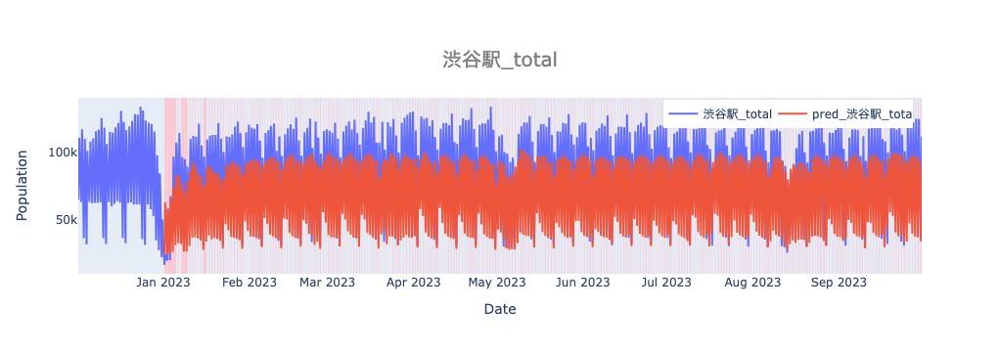

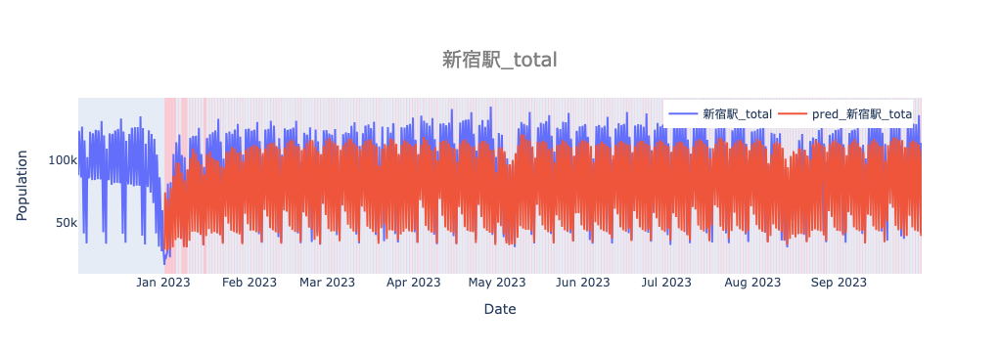

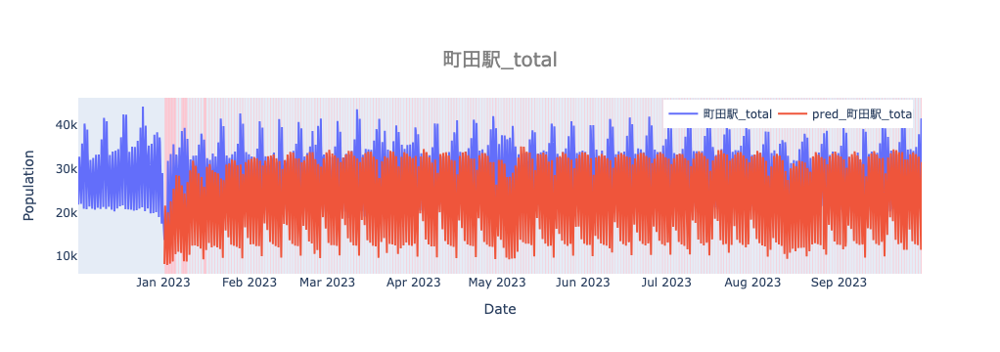

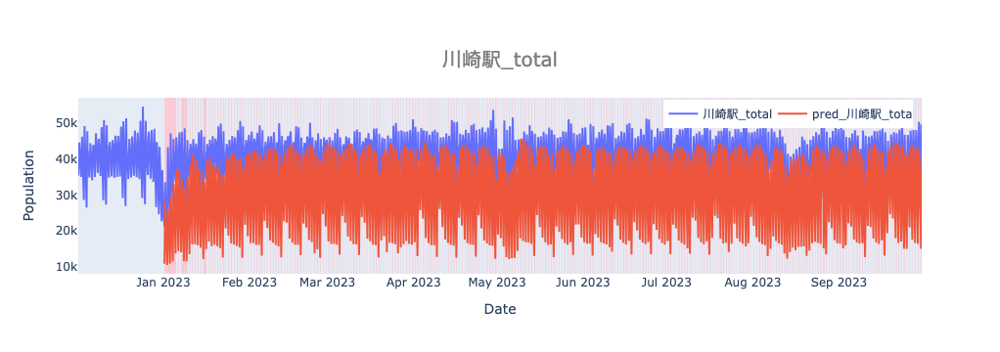

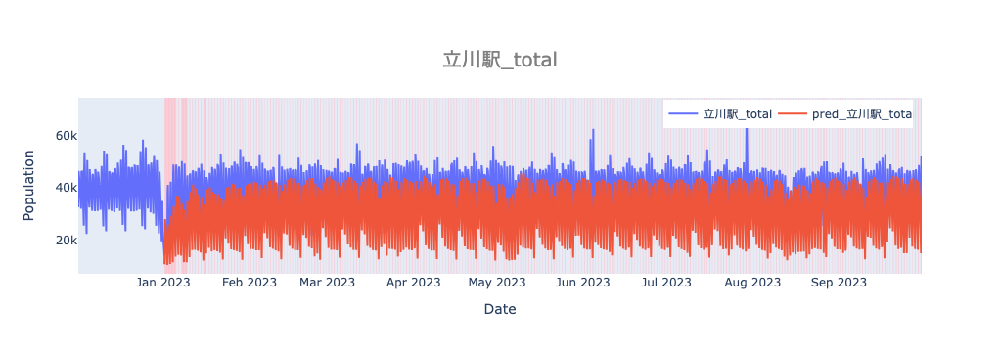

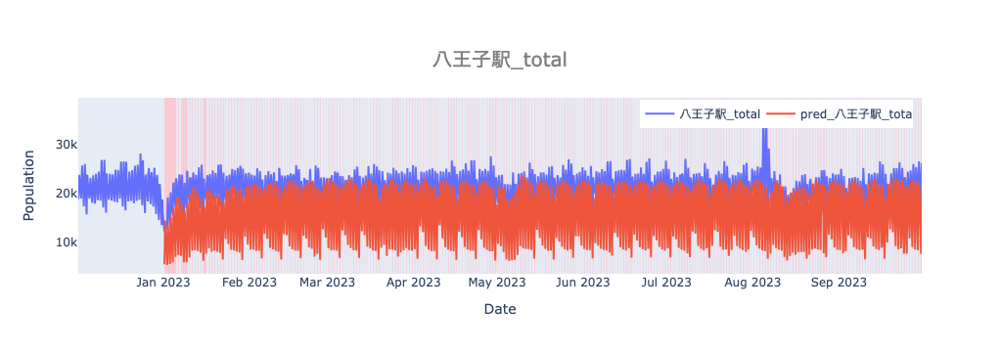

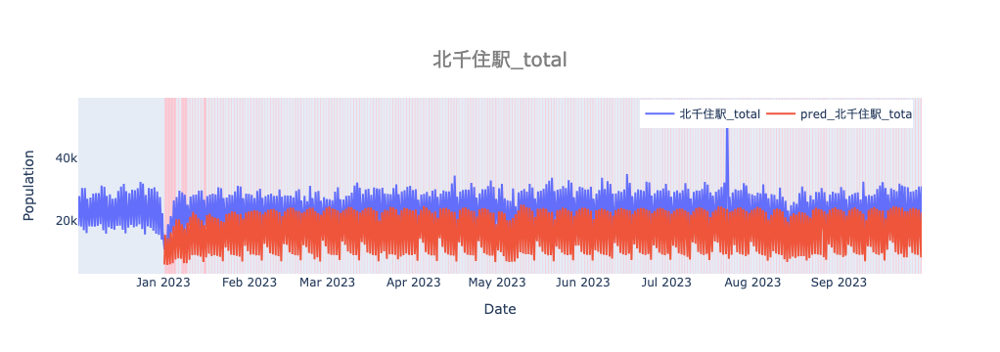

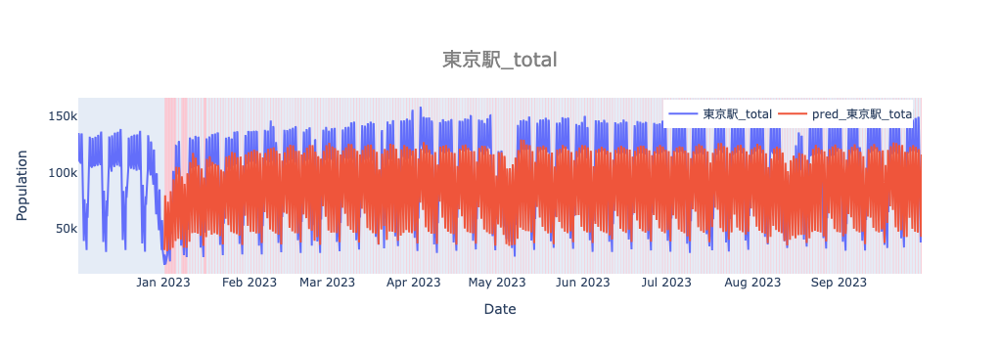

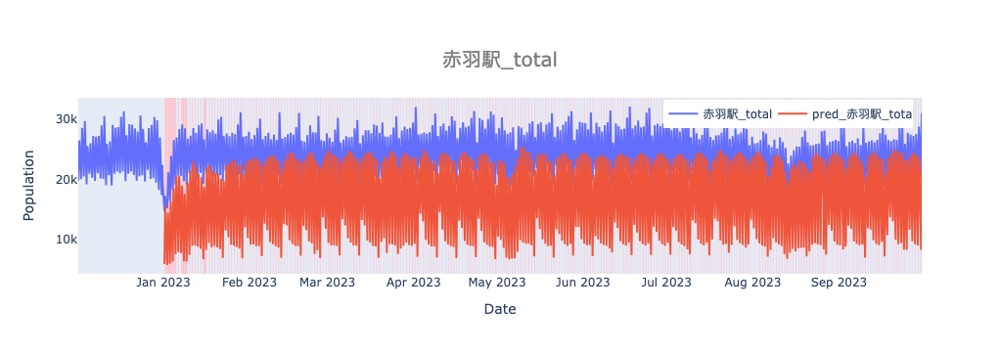

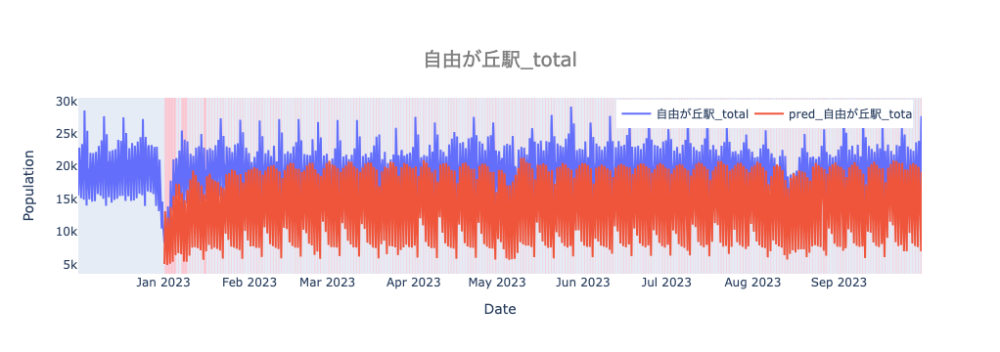

In [347]:
# make y_true df from a specific date
_df_valid = df_valid.loc['2022-12-01': ,:]
y_true = pd.concat([_df_valid, df_test]).iloc[:, :num_features_pred]

# plot with plotly     
for i in range(y_pred.shape[1]):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y_true.index, y=y_true.iloc[:, i], name=y_true.columns[i]))
    fig.add_trace(go.Scatter(x=y_pred.index, y=y_pred.iloc[:, i], name=y_pred.columns[i]))
    
    fig.update_xaxes(title="Date",showgrid=False)
    fig.update_yaxes(title="Population", showgrid=False)
    fig.update_layout(legend=dict(x=0.99,
                              y=0.99,
                              xanchor='right',
                              yanchor='top',
                              orientation='h',
                              ),
                      hovermode='x unified',
                      title=dict(text=y_true.columns[i],
                                 font=dict(size=20, color='grey'),
                                 xref='paper', # container or paper
                                 x=0.5,
                                 y=0.85,
                                 xanchor='center'
                                )
                     )
    
    for t, next_t in zip(anomaly_df.index , anomaly_next_hours): 
        fig.add_vrect(
                    x0=t,
                    x1=next_t,
                    fillcolor='pink',
                    opacity=0.9,
                    line_width=0,
                    layer='below'
                    )
    
    fig.show()

### Save the results and the model 

In [358]:
'''
save the model, its loss, and params used
'''
# count the number of files in the directory
path = '/Users/koki/PycharmProjects/MasterThesis/models'

# read parameter data
df1 = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='params')

# set a model name
num = 'model_' + str(df1.shape[0]+1).zfill(2)

# get params used in this file
series = pd.concat([pd.Series(yaml_data['dataset']), pd.Series(yaml_data['model']), pd.Series(yaml_data['training'])])
params = pd.DataFrame(series).T
params.insert(0, "num", num)
params.insert(1, "file_name", "LSTM_seq2seq_ver8")  ###### the name of this file! ######
params.insert(2, "date_of_execution", datetime.datetime.today().strftime("%Y-%m-%d %H:%M"))
params.insert(3, "execution_time", elapsed_time)
params.insert(params.shape[1], "final_train_loss" , math.floor(train_losses[-1]))
params.insert(params.shape[1], "rmse_pred_actu" , math.floor(np.mean(rmse_pre_actu)))
params.insert(params.shape[1], "mae_pred_actu" , math.floor(np.mean(mae_pre_actu)))
params.insert(params.shape[1], "rmse_ben" , math.floor(0.0))
df1 = pd.concat([df1, params])

# read loss data
df2 = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='train_losses')
df2 = pd.concat([df2, pd.Series(train_losses, name=num)], axis=1)

# export the data 
with pd.ExcelWriter('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx') as writer:
    df1.to_excel(writer, sheet_name='params', index=False)
    df2.to_excel(writer, sheet_name='train_losses', index=False)

# save the model
torch.save(model, '/Users/koki/PycharmProjects/MasterThesis/models/' + num + '.pth')

In [154]:
# notification
# !afplay '/Users/koki/Documents/セレナと一緒/result_message.m4a'

In [19]:
print('Done!')

Done!


### Memo

In [20]:
'''
再帰的に予測する際、t+1期のインプットには、t期の人流のアウトプット（t+1期の人流の予測値）＋t+1期の実際のダミー情報（t期からアウトプットされた予測ではなく本当のデータ）を利用する。
    →例えば曜日などは予測しなくてもわかるはずなので、わざわざ再帰的に予測値をインプットする必要がない
'''

'\n再帰的に予測する際、t+1期のインプットには、t期の人流のアウトプット（t+1期の人流の予測値）＋t+1期の実際のダミー情報（t期からアウトプットされた予測ではなく本当のデータ）を利用する。\n    →例えば曜日などは予測しなくてもわかるはずなので、わざわざ再帰的に予測値をインプットする必要がない\n'

### Questions

In [ ]:
'''
seq2seqの推論時、decoderは前期の出力を入力して、再起的にループさせる。それは学習時も同じ？

単純なlstmは、出力が一期先のみ。targetが複数期先にして学習する時は、学習時もループさせるの？
もしそうなら、targetも複数期ある意味は？それってseq_len_src=8, seq_len_tgt=1のデータセットで学習するのと同じじゃない？

ベンチマークは、機械学習を使わなかったらどういう予測になるかを見るため？もしそうならベンチマークと比べるのは実測値？
 - 

バグの原因は、ミニバッチでpredictしていたからだった。ミニバッチにして一気に予測しようとしていたけど、一気にencoderに入れるとencoderの出力が変わっちゃう？
 - 


'''

### Insight

In [21]:
'''
num_layersよりhidden_sizeを増やした方が精度が良い →　(num_layers=2, hidden_size=128) > (num_layers=3, hidden_size=64)
'''

'\nnum_layersよりhidden_sizeを増やした方が精度が良い →\u3000(num_layers=2, hidden_size=128) > (num_layers=3, hidden_size=64)\n'

### To Do

In [22]:
'''
'''

'\n'